In [1]:
import torch
import torch.nn as nn
from torch import optim
from torch.utils.data import Dataset, DataLoader, random_split
from PIL import Image
from torchvision.transforms import Resize, ToTensor, Normalize, Compose
from matplotlib import pyplot as plt

from torchvision.models import resnet50,ResNet50_Weights 

from io import open
import unicodedata
import re

In [2]:
if torch.cuda.is_available():
    device=torch.device(type='cuda', index=0)
else:
    device=torch.device(type='cpu', index=0)

In [3]:
def normalizeString(s): 
    sres=""
    for ch in unicodedata.normalize('NFD', s):     
        if unicodedata.category(ch) != 'Mn':
            sres+=ch
    sres = re.sub(r"[^a-zA-Z!?,]+", r" ", sres) 
    return sres.strip()

In [4]:
capt_file_path="/kaggle/input/flickr8k/captions.txt"
images_dir_path="/kaggle/input/flickr8k/Images/"
data=open(capt_file_path).read().strip().split('\n')
data=data[1:]

img_filenames_list=[]
captions_list=[]

for s in data:
    templist=s.lower().split(",")
    img_path=templist[0]
    caption=",".join(s for s in templist[1:])
    caption=normalizeString(caption)
    img_filenames_list.append(img_path)
    captions_list.append(caption)

In [5]:
max_cap_length=73

In [6]:
class Vocab:
    def __init__(self):
        self.word2index={'SOS':0, 'EOS':1}
        self.index2word={0:'SOS', 1:'EOS'}
        self.word2count={}
        self.nwords=2
    
    def buildVocab(self,s):
        for word in s.split(" "):
            if word not in self.word2index:
                self.word2index[word]=self.nwords
                self.index2word[self.nwords]=word
                self.word2count[word]=1
                self.nwords+=1
            else:
                self.word2count[word]+=1

In [7]:
vocab=Vocab()
for caption in captions_list:
    vocab.buildVocab(caption)
print("Vocab Length:",vocab.nwords)

Vocab Length: 8446


In [8]:
class CustomDataset(Dataset):
    def __init__(self,images_dir_path, img_filenames_list, captions_list, vocab, max_cap_length):
        super().__init__()
        self.images_dir_path=images_dir_path
        self.img_filenames_list=img_filenames_list
        self.captions_list=captions_list
        self.length=len(self.captions_list)
        self.transform=Compose([Resize((224,224), antialias=True), ToTensor(), Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225])])
        self.vocab=vocab
        self.max_cap_length=max_cap_length
    
    def __len__(self):
        return self.length
    
    def get_input_ids(self, sentence,vocab):
        input_ids=[0]*(self.max_cap_length+1)
        i=0
        for word in sentence.split(" "):
            input_ids[i]=vocab.word2index[word]
            i=i+1

        input_ids.insert(0,vocab.word2index['SOS'])
        i=i+1
        input_ids[i]=vocab.word2index['EOS']
    
        return torch.tensor(input_ids)
    
    def __getitem__(self,idx):
        imgfname,caption=self.img_filenames_list[idx],self.captions_list[idx]
        
        imgfname=self.images_dir_path+imgfname
        img=Image.open(imgfname)
        img=self.transform(img)
        
        caption=self.get_input_ids(caption,self.vocab)       
        
        return img,caption

In [9]:
#driver code part 3
dataset=CustomDataset(images_dir_path, img_filenames_list, captions_list, vocab, max_cap_length)
train_dataset,test_dataset=random_split(dataset,[0.999,0.001])

batch_size=64
train_dataloader=DataLoader(dataset=train_dataset,batch_size=batch_size, shuffle=True)
test_dataloader=DataLoader(dataset=test_dataset,batch_size=1, shuffle=False)

In [10]:
class Encoder(nn.Module):
    def __init__(self, pretrained_feature_extractor):
        super().__init__()
        self.pretrained_feature_extractor=pretrained_feature_extractor
        
    def forward(self,x):
        features=self.pretrained_feature_extractor(x)
        return features

In [11]:
pretrained_feature_extractor=resnet50(weights=ResNet50_Weights.DEFAULT)
pretrained_feature_extractor.fc=nn.Linear(2048,1024)
encoder=Encoder(pretrained_feature_extractor).to(device)

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 144MB/s] 


In [12]:
class Decoder(nn.Module):
    def __init__(self,output_size,embed_size,hidden_size):
        super().__init__()
        self.e=nn.Embedding(output_size,embed_size)
        self.relu=nn.ReLU()
        self.gru=nn.GRU(embed_size, hidden_size, batch_first=True)
        self.lin=nn.Linear(hidden_size,output_size)
        self.lsoftmax=nn.LogSoftmax(dim=-1)
    
    def forward(self,x,prev_hidden):
        x=self.e(x)
        x=self.relu(x)
        output,hidden=self.gru(x,prev_hidden)
        y=self.lin(output)
        y=self.lsoftmax(y)
        return y, hidden

In [13]:
embed_size=300
hidden_size=1024
decoder=Decoder(vocab.nwords,embed_size,hidden_size).to(device)

In [14]:
def train_one_epoch():
    encoder.train()
    decoder.train()
    track_loss=0
    
    for i, (imgs,t_ids) in enumerate(train_dataloader):
        imgs=imgs.to(device)
        t_ids=t_ids.to(device)
        extracted_features=encoder(imgs)
        #extracted_features=extracted_features.detach()
        decoder_hidden=torch.reshape(extracted_features,(1,extracted_features.shape[0],-1))
        yhats, decoder_hidden = decoder(t_ids[:,0:-1],decoder_hidden)
                    
        gt=t_ids[:,1:]
        
        yhats_reshaped=yhats.view(-1,yhats.shape[-1])
        
        gt=gt.reshape(-1)
        
        
        loss=loss_fn(yhats_reshaped,gt)
        track_loss+=loss.item()
        
        opte.zero_grad()
        optd.zero_grad()
        
        loss.backward()
        
        opte.step()
        optd.step()
        
        if i%50==0:
            print("Mini Batch=", i+1," Running Loss=",track_loss/(i+1), sep="")
        
    return track_loss/len(train_dataloader)    

In [15]:
def ids2Sentence(ids,vocab):
    sentence=""
    for id in ids.squeeze():
        if id==0:
            continue
        word=vocab.index2word[id.item()]
        sentence+=word + " "
        if id==1:
            break
    return sentence

In [16]:
def eval_one_epoch():
    encoder.eval()
    decoder.eval()
    track_loss=0
    with torch.no_grad():
        for i, (imgs,t_ids) in enumerate(test_dataloader):
            imgs=imgs.to(device)
            t_ids=t_ids.to(device)
            extracted_features=encoder(imgs)
            decoder_hidden=torch.reshape(extracted_features,(1,extracted_features.shape[0],-1)) #n_dim=3
            input_ids=t_ids[:,0]
            yhats=[]
            pred_sentence=""
            
            for j in range(1,max_cap_length+2): #j starts from 1
                probs, decoder_hidden = decoder(input_ids.unsqueeze(1),decoder_hidden)
                yhats.append(probs)
                _,input_ids=torch.topk(probs,1,dim=-1)
                input_ids=input_ids.squeeze(1,2) #still a tensor
                word=vocab.index2word[input_ids.item()] #batch_size=1
                pred_sentence+=word + " "
                if input_ids.item() == 1: #batch_size=1
                    break
                                
            
            gt_sentence=ids2Sentence(t_ids,vocab)
            
            print("Input Image:")
            img=imgs[0]
            img[0]=(img[0]*0.229)+0.485
            img[1]=(img[1]*0.224)+0.456
            img[2]=(img[2]*0.225)+0.406
            plt.imshow(torch.permute(imgs[0],(1,2,0)).detach().cpu())
            plt.show()
            
            print("GT Sentence:",gt_sentence)
            
            print("Predicted Sentence:",pred_sentence)
            
            yhats_cat=torch.cat(yhats,dim=1)
            yhats_reshaped=yhats_cat.view(-1,yhats_cat.shape[-1])
            gt=t_ids[:,1:j+1]
            gt=gt.view(-1)
            

            loss=loss_fn(yhats_reshaped,gt)
            track_loss+=loss.item()
            
            
        print("-----------------------------------")
        return track_loss/len(test_dataloader)    

In [18]:
loss_fn=nn.NLLLoss(ignore_index=0).to(device)
lr=0.001
optd=optim.Adam(params=decoder.parameters(), lr=lr)
opte=optim.Adam(params=encoder.parameters(), lr=lr)
n_epochs=10
for e in range(n_epochs):
    print("Epoch=",e+1, " Loss=", round(train_one_epoch(),4), sep="")

Mini Batch=1 Running Loss=4.795391082763672
Mini Batch=51 Running Loss=4.439129268421846
Mini Batch=101 Running Loss=4.193607632476504
Mini Batch=151 Running Loss=4.039731930423256
Mini Batch=201 Running Loss=3.917366401473088
Mini Batch=251 Running Loss=3.8164934694054593
Mini Batch=301 Running Loss=3.733194824073006
Mini Batch=351 Running Loss=3.6665716707876266
Mini Batch=401 Running Loss=3.6066295482274007
Mini Batch=451 Running Loss=3.5569179539141262
Mini Batch=501 Running Loss=3.5104992589550816
Mini Batch=551 Running Loss=3.4691329448063013
Mini Batch=601 Running Loss=3.4337628617659584
Epoch=1 Loss=3.4105
Mini Batch=1 Running Loss=2.9166409969329834
Mini Batch=51 Running Loss=2.6457596152436498
Mini Batch=101 Running Loss=2.679187994192142
Mini Batch=151 Running Loss=2.6711149120962383
Mini Batch=201 Running Loss=2.662623739954251
Mini Batch=251 Running Loss=2.658104316171897
Mini Batch=301 Running Loss=2.6542922785115795
Mini Batch=351 Running Loss=2.650789223505221
Mini Batc

Input Image:


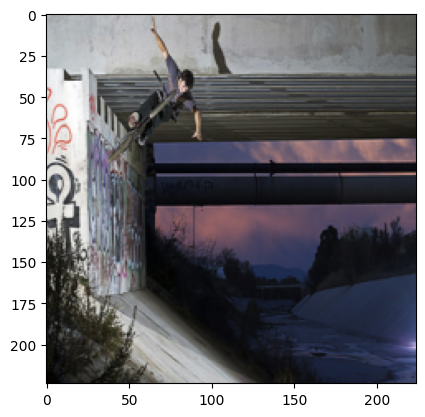

GT Sentence: a boy on a bike does a stunt on a ramp filled with graffiti EOS 
Predicted Sentence: a man on a bike is doing a stunt high in the air EOS 
Input Image:


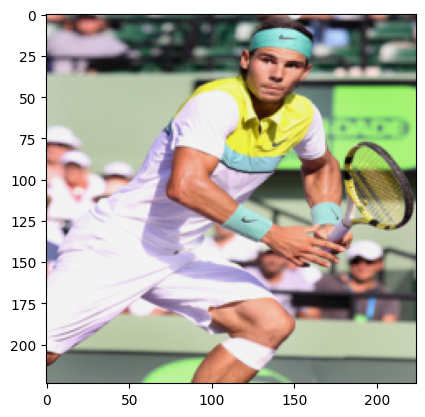

GT Sentence: a man gets ready to hit the tennis ball EOS 
Predicted Sentence: a tennis player with green and green headband on a green headband EOS 
Input Image:


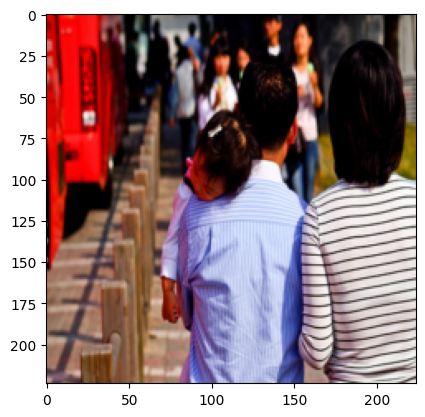

GT Sentence: a couple are walking along a street while the man carries a toddler over one shoulder EOS 
Predicted Sentence: a man and a woman looking at something in the distance EOS 
Input Image:


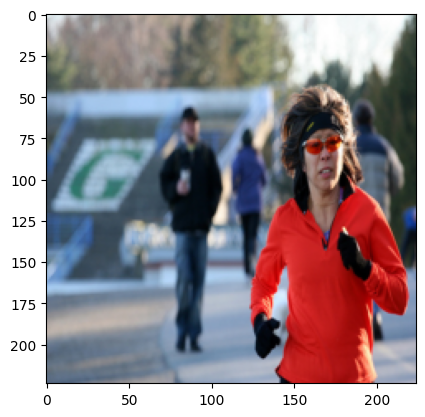

GT Sentence: a woman in orange sunglasses jogs EOS 
Predicted Sentence: a woman in a red sweater is running on the street EOS 
Input Image:


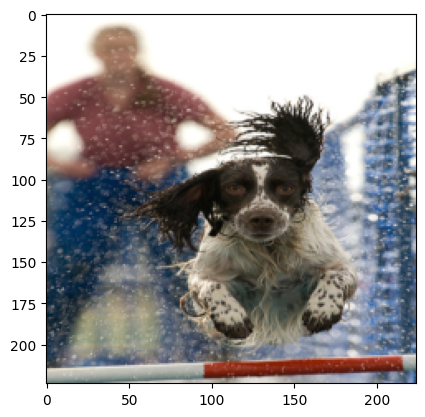

GT Sentence: a wet spaniel clears a jump EOS 
Predicted Sentence: a wet dog is jumping over obstacles EOS 
Input Image:


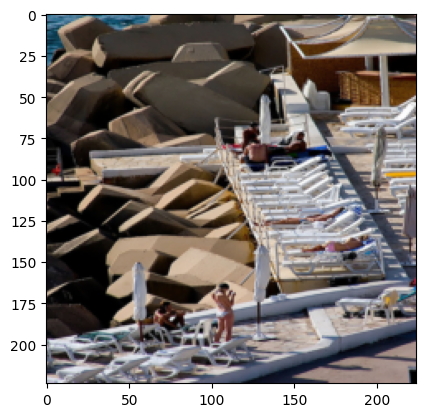

GT Sentence: white lounge chairs are lined up at a resort for sunbathers EOS 
Predicted Sentence: several people lay out in the sun on white lawn chairs by a body of water EOS 
Input Image:


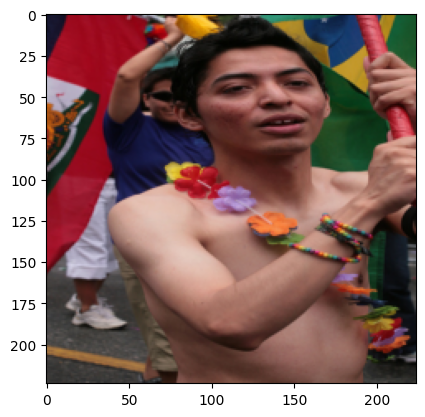

GT Sentence: a shirtless man wearing bracelets and a garland , carrying a pole EOS 
Predicted Sentence: a young man raises his arms as he stands in a parade wearing bright pink EOS 
Input Image:


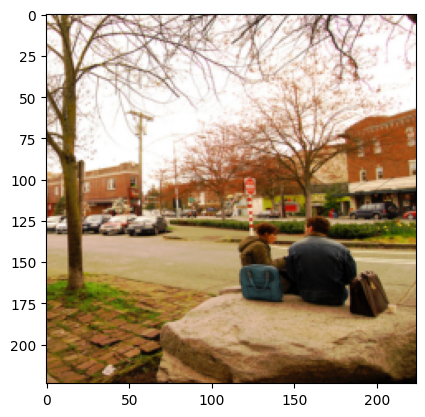

GT Sentence: two people talk while sitting on a big rock EOS 
Predicted Sentence: a couple sits on a rock beside a street EOS 
Input Image:


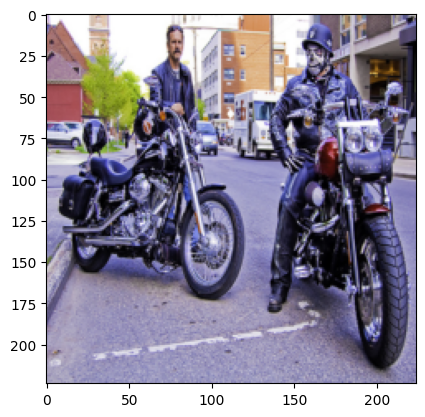

GT Sentence: two bikers , one with a mask , pose in the street with their bikes EOS 
Predicted Sentence: two motorcyclists are standing beside the street wearing a leather jacket EOS 
Input Image:


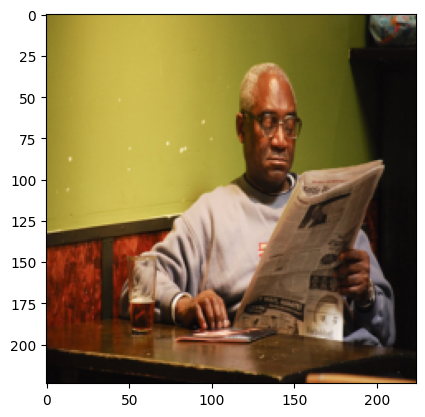

GT Sentence: a man drinking and reading the paper EOS 
Predicted Sentence: a man wearing a white hat sits at the table EOS 
Input Image:


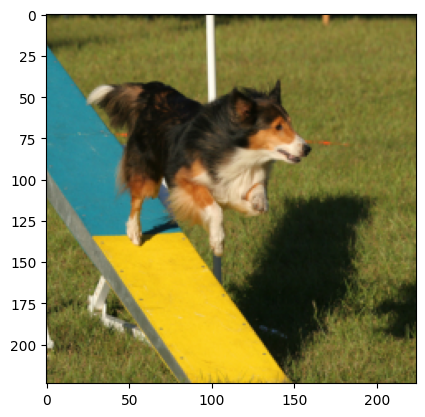

GT Sentence: a collie runs down a slide EOS 
Predicted Sentence: a dog is running down a ramp EOS 
Input Image:


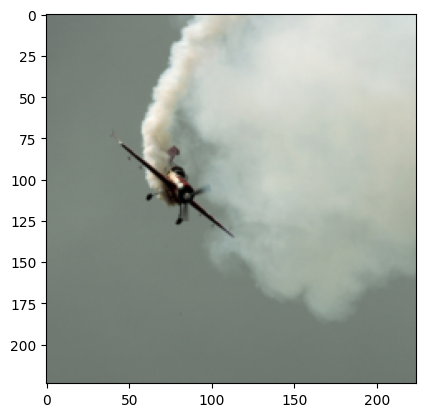

GT Sentence: a stunt plane is billowing smoke into a clear , grey sky EOS 
Predicted Sentence: a plane is diving through the sky creating a cloud of smoke behind it EOS 
Input Image:


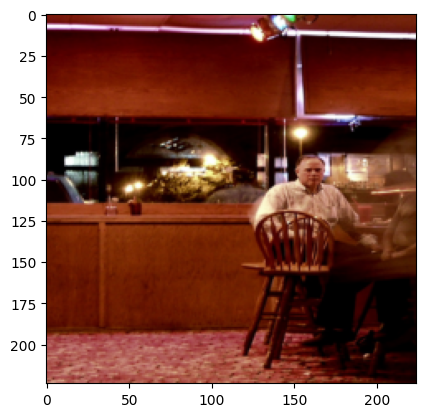

GT Sentence: there is a man sitting in a restaurant at night EOS 
Predicted Sentence: man sits at a table in a room EOS 
Input Image:


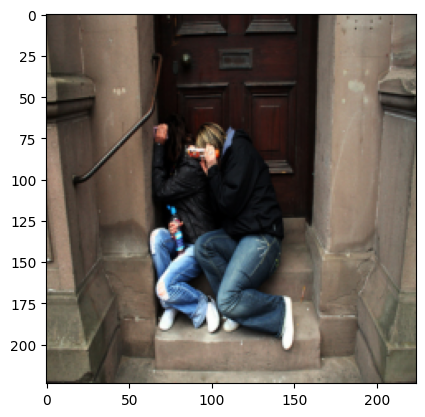

GT Sentence: two people wearing jeans huddle near a wooden door , sheilding their faces from the camera EOS 
Predicted Sentence: a couple cuddling on the corner of a building EOS 
Input Image:


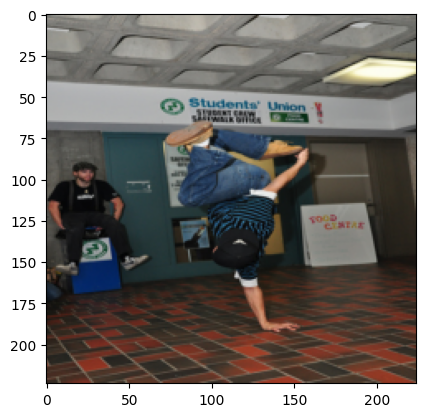

GT Sentence: guy break dancing on brick floor in front of students union EOS 
Predicted Sentence: a man and a woman wait on a bench EOS 
Input Image:


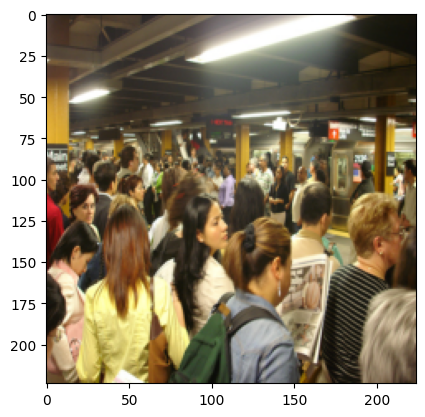

GT Sentence: a crowd of people in a subway EOS 
Predicted Sentence: a crowd of people are gathered in a busy subway station EOS 
Input Image:


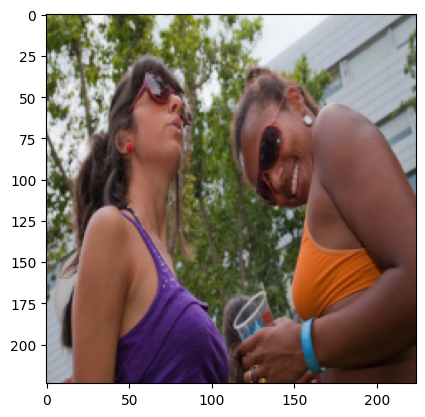

GT Sentence: a woman wearing purple looks away while a woman in orange grins at the camera EOS 
Predicted Sentence: a woman wearing purple and sunglasses smiles EOS 
Input Image:


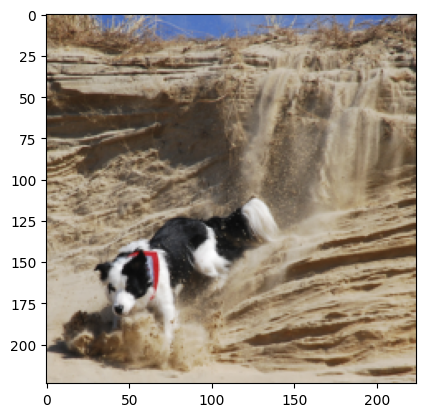

GT Sentence: a black and white dog is sliding down a sandy hill EOS 
Predicted Sentence: a black and white dog wearing a red collar is digging in the dirt EOS 
Input Image:


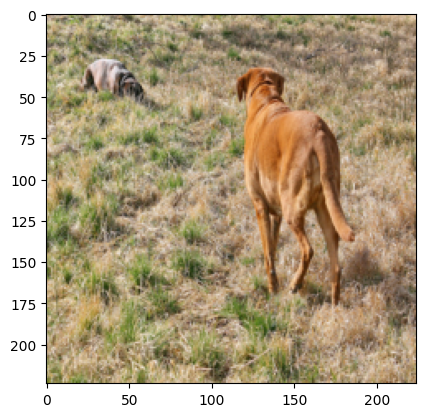

GT Sentence: a standing brown dog watches another dog lay in the grass EOS 
Predicted Sentence: a brown dog walks towards another animal hiding in the grass EOS 
Input Image:


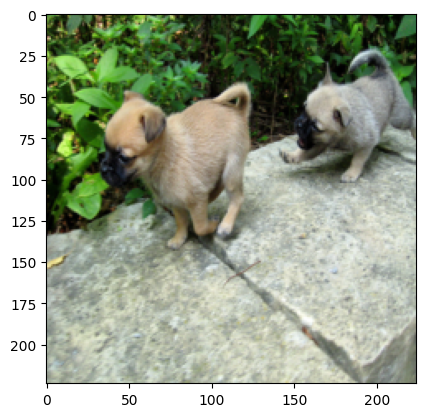

GT Sentence: two little puppies chase each other on a stone wall EOS 
Predicted Sentence: two puppies walking on the sidewalk EOS 
Input Image:


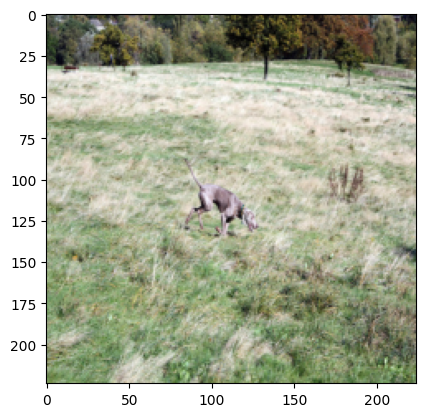

GT Sentence: a greyhound is active in a grassy field EOS 
Predicted Sentence: a dog runs past a large , fallen lawn EOS 
Input Image:


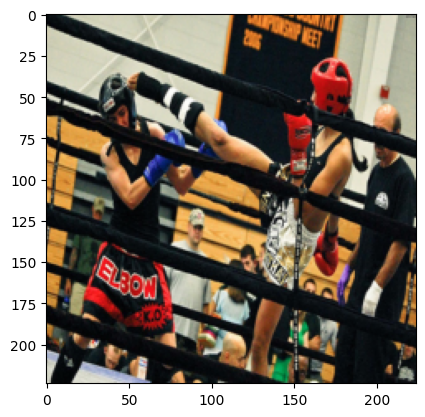

GT Sentence: woman kicking head of another kick boxer EOS 
Predicted Sentence: two people kick boxing , with others spectating EOS 
Input Image:


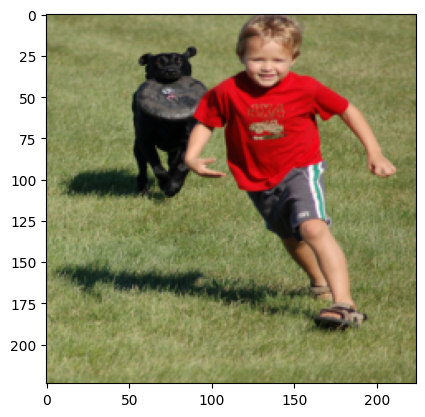

GT Sentence: a red shirted boy and a black dog with a frisbee run in the green grass EOS 
Predicted Sentence: a boy runs with a dog EOS 
Input Image:


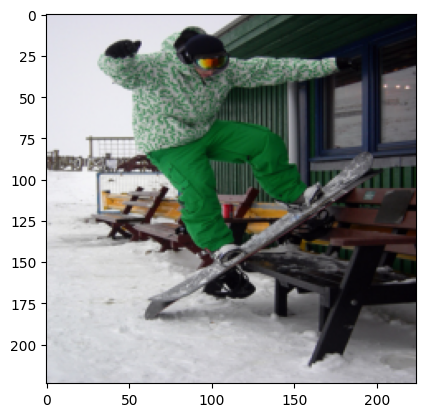

GT Sentence: a person in a green and white jacket and green pants is practicing on his snowboard EOS 
Predicted Sentence: a man wearing green pants is standing on a snowboard EOS 
Input Image:


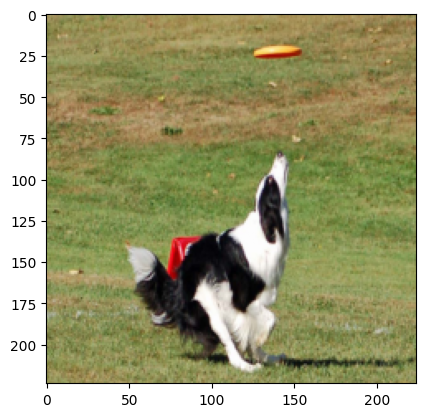

GT Sentence: a black and white dog leaps to catch an orange frisbee EOS 
Predicted Sentence: a black and white dog is going after an orange frisbee EOS 
Input Image:


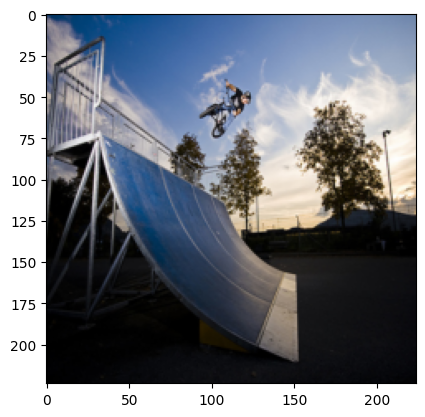

GT Sentence: a bmx biker flies in the air off of a ramp EOS 
Predicted Sentence: a man on a bike goes through the air EOS 
Input Image:


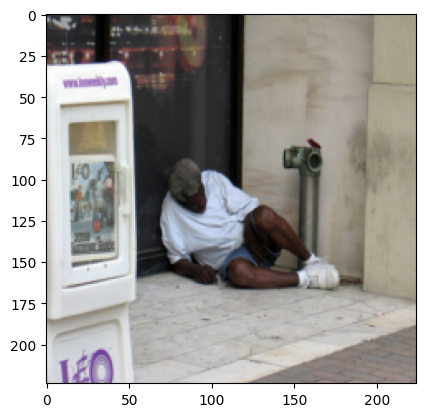

GT Sentence: the dark skinned man is laying in a doorway next to a metal pipe EOS 
Predicted Sentence: a man sits outside a building EOS 
Input Image:


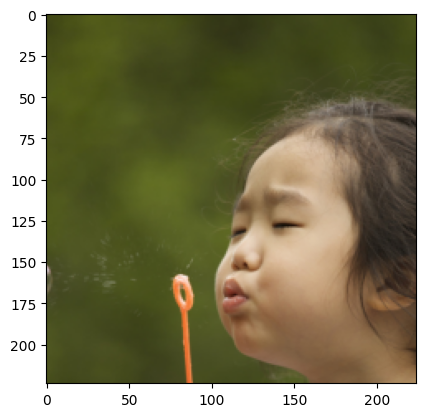

GT Sentence: a little girl closes her eyes and blows through a bubble wand EOS 
Predicted Sentence: a young girl is blowing bubbles with an orange bubble wand EOS 
Input Image:


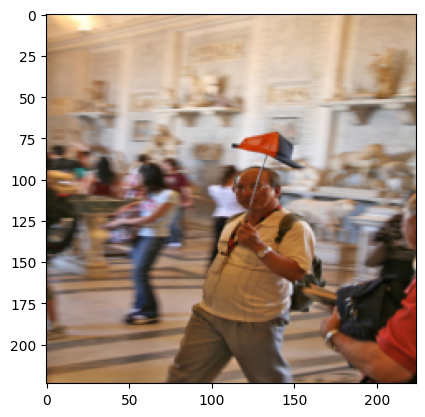

GT Sentence: a man walking while holding a hat on a stick EOS 
Predicted Sentence: a man holds a very small umbrella EOS 
Input Image:


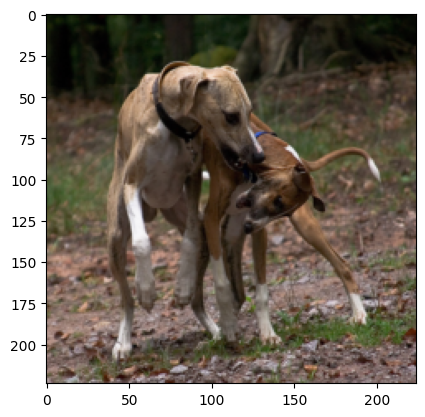

GT Sentence: two brown dogs playing in a rough manner EOS 
Predicted Sentence: two dogs are wrestling in a fenced in area EOS 
Input Image:


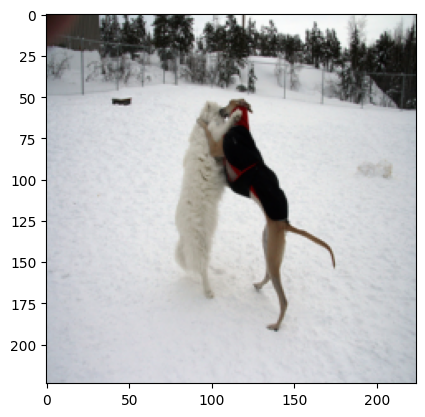

GT Sentence: two dogs wrestle in the snow in a fenced in area EOS 
Predicted Sentence: two dogs play in the snow EOS 
Input Image:


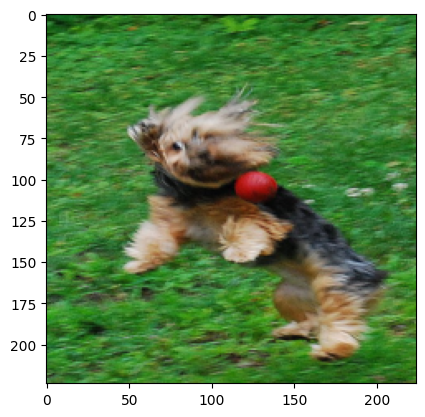

GT Sentence: a yorkie trying to catch a red toy EOS 
Predicted Sentence: a dog jumps to catch a red ball in the grass EOS 
Input Image:


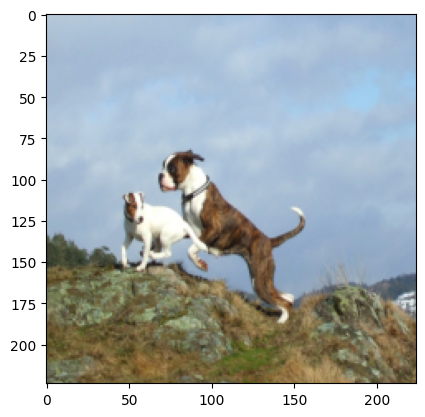

GT Sentence: two brown and white dogs , one a boxer and the other a terrier , play on a rock covered hill with a blue sky and powdery clouds in the background EOS 
Predicted Sentence: two dogs are running in the sand EOS 
Input Image:


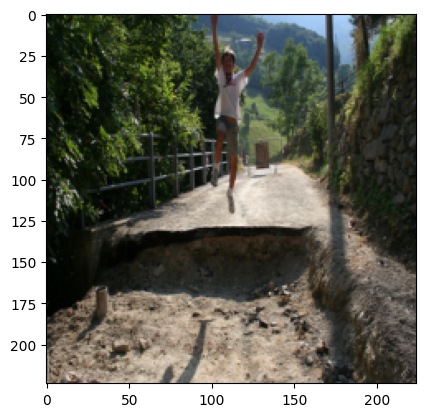

GT Sentence: a wmoan is jumping off land and into a ditch EOS 
Predicted Sentence: a boy is jumping over a large hole in the ground EOS 
Input Image:


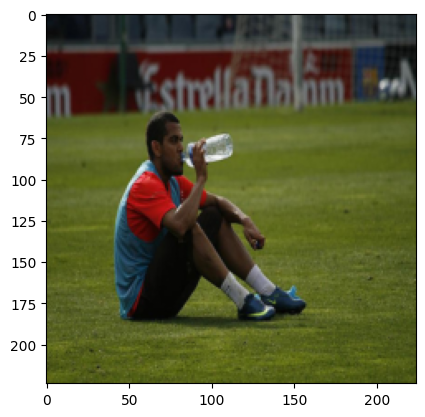

GT Sentence: a soccer player sits on the field drinking water EOS 
Predicted Sentence: a soccer player sits on the grass drinking and makes a face EOS 
Input Image:


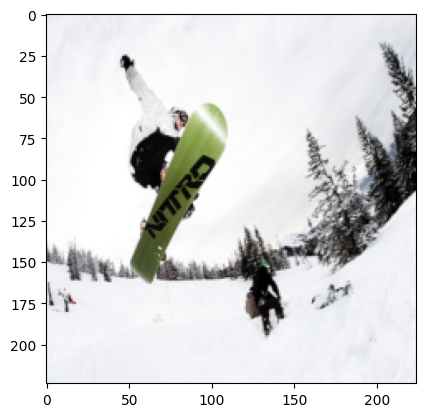

GT Sentence: someone on a nitro snowboard in midair and another person on the ground behind them EOS 
Predicted Sentence: a person on a snowmobile EOS 
Input Image:


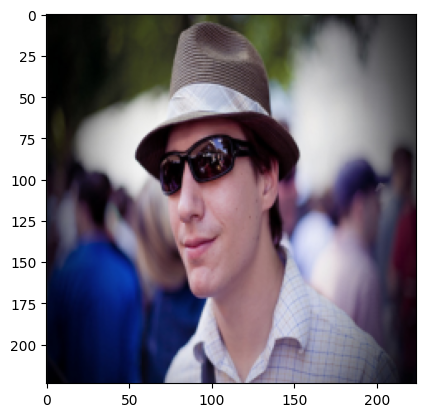

GT Sentence: a man wearing sunglasses and a hat near a crowd EOS 
Predicted Sentence: a man wearing sunglasses is wearing a blitz hat and sunglasses EOS 
Input Image:


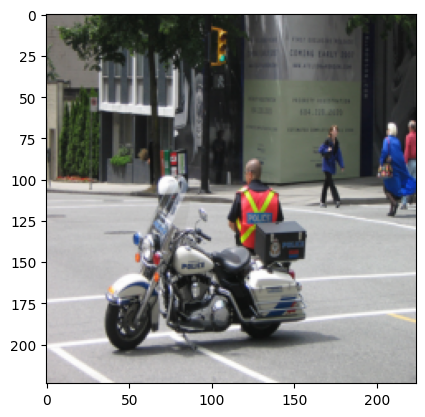

GT Sentence: a policeperson is near a police motorcycle EOS 
Predicted Sentence: a cop sits on a police motorcycle EOS 
Input Image:


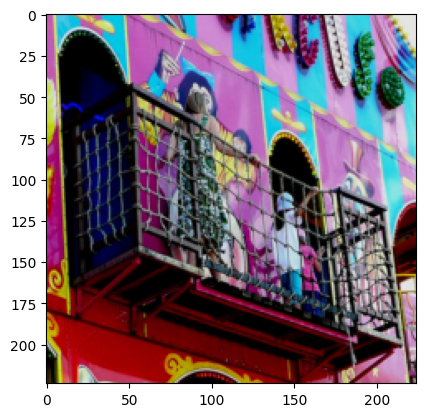

GT Sentence: a woman and children navigate the balcony of an amusement ride EOS 
Predicted Sentence: a woman and two children walking through the upper levels of a carnival attraction EOS 
Input Image:


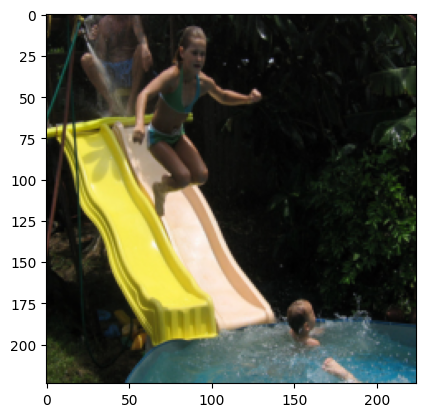

GT Sentence: a young girl in a blue bathing suit jumps off of a yellow slide into the water EOS 
Predicted Sentence: a young girl jumping off a yellow slide into a pool EOS 
-----------------------------------
Epoch=1 Loss=8.4717


In [19]:
for e in range(1):
    print("Epoch=",e+1, " Loss=", round(eval_one_epoch(),4), sep="")